# Step 1: Data Exploration and Cleaning

In [1]:
# Core data libraries
import pandas as pd
import numpy as np
import datetime

# Visualization
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

# For statistical visualizations
from plotly.subplots import make_subplots

# Modeling (optional for later phase)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Advanced modeling (optional for future)
import xgboost as xgb
import lightgbm as lgb
import shap

# For saving/loading models
import joblib

# Streamlit (for dashboard)
import streamlit as st

# Settings
import warnings
warnings.filterwarnings('ignore')

In [2]:

import pandas as pd

# Load your dataset
df = pd.read_excel("Ecommerce pharmacy sales - data science project.xlsx")

# Show basic info
print("Dataset Info:")
print(df.info())
print("Data Shape:", df.shape)
print("\nData Types:\n", df.dtypes)
print("\nMissing Values:\n", df.isnull().sum())

# Display sample data
print("\nSample Data:\n", df.head(10))

# Check for duplicates
print("\nDuplicates:", df.duplicated().sum())


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206060 entries, 0 to 206059
Data columns (total 11 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   Store ID               206060 non-null  object        
 1   Customer Type          206060 non-null  object        
 2   Invoice Type           206060 non-null  object        
 3   Gender                 206060 non-null  object        
 4   Trx Date               206060 non-null  datetime64[ns]
 5   Category               206060 non-null  object        
 6   Brand                  206060 non-null  object        
 7   Invoices Items Count   206060 non-null  int64         
 8   Items Qty Per Invoice  206060 non-null  int64         
 9   Total sales            206060 non-null  float64       
 10  Customer City          206060 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(7)
memory usage: 17.3+ MB
None
Data Sha

In [3]:
# Display Columns
df.columns

Index(['Store ID', 'Customer Type', 'Invoice Type', 'Gender', 'Trx Date',
       'Category', 'Brand', 'Invoices Items Count', 'Items Qty Per Invoice',
       'Total sales', 'Customer City'],
      dtype='object')

In [4]:
for col in df.columns:
    print(f"\nColumn: {col}")
    print(f"Unique Values Count: {df[col].nunique()}")
    print(df[col].unique())


Column: Store ID
Unique Values Count: 977
['Branch0019' 'Branch0031' 'Branch0145' 'Branch0146' 'Branch0149'
 'Branch0190' 'Branch0193' 'Branch0218' 'Branch0329' 'Branch0364'
 'Branch0716' 'Branch0749' 'Branch0797' 'Branch1242' 'Branch1244'
 'Branch1245' 'Branch1257' 'Branch0020' 'Branch0037' 'Branch0049'
 'Branch0066' 'Branch0070' 'Branch0073' 'Branch0105' 'Branch0147'
 'Branch0156' 'Branch0175' 'Branch0177' 'Branch0195' 'Branch0217'
 'Branch0254' 'Branch0390' 'Branch0741' 'Branch1239' 'Branch1255'
 'Branch1275' 'Branch1287' 'Branch0036' 'Branch0045' 'Branch0047'
 'Branch0054' 'Branch0131' 'Branch0144' 'Branch0148' 'Branch0164'
 'Branch0191' 'Branch0286' 'Branch0702' 'Branch0769' 'Branch1236'
 'Branch1237' 'Branch1251' 'Branch1262' 'Branch1265' 'Branch1271'
 'Branch1292' 'Branch0027' 'Branch0046' 'Branch0067' 'Branch0103'
 'Branch0137' 'Branch0161' 'Branch0196' 'Branch0214' 'Branch0276'
 'Branch0283' 'Branch0340' 'Branch0346' 'Branch0762' 'Branch0778'
 'Branch1230' 'Branch1281' 'Branc

In [5]:
# Display descriptive statistics
df.describe()

,Trx Date,Invoices Items Count,Items Qty Per Invoice,Total sales
count,206060,206060.000000,206060.000000,206060.000000
mean,2025-03-26 10:20:47.263904,1.127638,2.054766,16.407147
min,2025-01-01 00:00:00,1.000000,-16.000000,-463.967500
25%,2025-02-22 00:00:00,1.000000,1.000000,6.845000
50%,2025-03-23 00:00:00,1.000000,1.000000,10.000000
75%,2025-05-03 00:00:00,1.000000,2.000000,20.000000
max,2025-06-19 00:00:00,30.000000,200.000000,919.680000
std,NaN,0.530677,2.950922,19.991228


# Step 2: Clean Up Common Issues


In [6]:
# Standardize gender values
df['Gender'] = df['Gender'].replace({'M': 'Male', 'F': 'Female'}).str.strip()

# Remove leading/trailing spaces in strings
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].str.strip()

# Ensure date column is in datetime format
df['Trx Date'] = pd.to_datetime(df['Trx Date'])

# Create additional time-based features
df['Month'] = df['Trx Date'].dt.month
df['Month_Name'] = df['Trx Date'].dt.month_name()
df['Year'] = df['Trx Date'].dt.year
df['Day_Name'] = df['Trx Date'].dt.day_name()
df

,Store ID,Customer Type,Invoice Type,Gender,Trx Date,Category,Brand,Invoices Items Count,Items Qty Per Invoice,Total sales,Customer City,Month,Month_Name,Year,Day_Name
0,Branch0019,E-commerce,Reservation,Male,2025-01-02,BABY NUTRITION,Nuralac,1,2,20.0000,Hofuf,1,January,2025,Thursday
1,Branch0019,E-commerce,Reservation,Male,2025-01-10,BABY NUTRITION,CERELAC,1,1,6.5175,Hofuf,1,January,2025,Friday
2,Branch0019,E-commerce,Reservation,Male,2025-01-17,BABY NUTRITION,CERELAC,1,1,17.0750,Hofuf,1,January,2025,Friday
3,Branch0019,E-commerce,Reservation,Male,2025-01-22,BABY NUTRITION,Nuralac,1,3,30.0000,Hofuf,1,January,2025,Wednesday
4,Branch0019,E-commerce,Reservation,Male,2025-01-23,BABY NUTRITION,CERELAC,1,1,7.6375,Hofuf,1,January,2025,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206055,Branch1294,Walk-in,Walking,Female,2025-06-16,BABY NURSERY,PIGEON,1,1,7.5000,Tabuk,6,June,2025,Monday
206056,Branch1294,Walk-in,Walking,Male,2025-06-17,BABY DIAPERS,Baby Joy,1,2,2.7550,Tabuk,6,June,2025,Tuesday
206057,Branch1294,Walk-in,Walking,Female,2025-06-18,BABY NURSERY,PIGEON,1,1,6.2500,Tabuk,6,June,2025,Wednesday
206058,Branch1294,Walk-in,Walking,Male,2025-06-19,BABY NURSERY,PIGEON,1,2,9.2500,Tabuk,6,June,2025,Thursday


#  Step 3: Save Cleaned Version

In [7]:
df.to_excel("cleaned_final_project.xlsx", index=False)

#  Step 4: EDA (Questions & Visualizations)

### SECTION 1 — OVERVIEW & CLEANING VALIDATION


#### 1. What is the distribution of customer types in the dataset?

In [8]:
# Define a custom color palette
custom_colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A']

fig = px.pie(
    df,
    names='Customer Type',
    title='Customer Type Distribution',
    hole=0.4,
    color_discrete_sequence=custom_colors
)

# Update layout for a more professional look
fig.update_layout(
    title_font=dict(size=24, family='Arial', color='black'),
    legend_title_text='Customer Type',
    legend=dict(
        orientation='h',
        y=-0.1,
        x=0.5,
        xanchor='center',
        font=dict(size=14)
    ),
    paper_bgcolor='white',
    plot_bgcolor='white'
)

# Add percentage labels inside the donut
fig.update_traces(
    textposition='inside',
    textinfo='percent+label',
    insidetextfont=dict(size=14, color='white')
)

fig.show()


#### 2. What is the distribution of genders?

In [9]:
import plotly.express as px

# Elegant gender-themed color palette (e.g., blue & pinkish tone)
gender_colors = ['#636EFA', '#EF5DA8']  # Adjust if you have more than 2 genders

fig = px.pie(
    df,
    names='Gender',
    title='Customer Gender Breakdown',
    hole=0.4,
    color_discrete_sequence=gender_colors
)

fig.update_traces(
    textinfo='percent+label',
    textposition='inside',
    insidetextfont=dict(size=14, color='white')
)

fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    legend_title_text='Gender',
    legend=dict(
        orientation='h',
        y=-0.1,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    ),
    paper_bgcolor='white',
    plot_bgcolor='white'
)

fig.show()


#### 3. What are the top 10 cities by number of transactions?

In [10]:
import plotly.express as px

# Prepare data
city_counts = df['Customer City'].value_counts().nlargest(10).reset_index()
city_counts.columns = ['Customer City', 'Transaction Count']

# Create enhanced bar chart
fig = px.bar(
    city_counts,
    x='Customer City',
    y='Transaction Count',
    title='Top 10 Cities by Transaction Count',
    text='Transaction Count',
    color='Transaction Count',
    color_continuous_scale='Blues'
)

# Update layout for professional style
fig.update_traces(
    textposition='outside'
)

fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='City',
    yaxis_title='Transactions',
    xaxis_tickangle=45,
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.show()

#### 4. Total Transactions Over Time

In [11]:
# Ensure datetime format
df['Trx Date'] = pd.to_datetime(df['Trx Date'])

# Group by day and count transactions
df_daily = df.groupby(df['Trx Date'].dt.date).size().reset_index(name='Transaction Count')

# Plot
fig = px.line(
    df_daily,
    x='Trx Date',
    y='Transaction Count',
    title='Transactions Over Time',
    markers=True,
    line_shape='spline'  # Smooth curve
)

# Styling
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Date',
    yaxis_title='Transaction Count',
    xaxis=dict(
        tickangle=0,
        tickformat='%b %d\n%Y',
        showgrid=True
    ),
    yaxis=dict(showgrid=True),
    plot_bgcolor='white',
    paper_bgcolor='white'
)

fig.update_traces(line=dict(color='#636EFA', width=2), marker=dict(size=6))

fig.show()


### SECTION 2 — SALES PERFORMANCE

#### 5. Which cities generate the highest total sales?

In [12]:
import plotly.express as px

# Aggregate top 10 cities by total sales
top_cities_sales = df.groupby('Customer City')['Total sales'].sum().nlargest(10).reset_index()

# Plot
fig = px.bar(
    top_cities_sales,
    x='Customer City',
    y='Total sales',
    title='Top 10 Cities by Total Sales',
    text='Total sales',
    color='Total sales',
    color_continuous_scale='Tealgrn'
)

# Layout and formatting
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='City',
    yaxis_title='Total Sales (SAR)',
    xaxis_tickangle=45,
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()

#### 6. Which brand categories bring in the most revenue?

In [13]:
import plotly.express as px

# Aggregate total sales by category
category_sales = df.groupby('Category')['Total sales'].sum().sort_values(ascending=False).reset_index()

# Create enhanced bar chart
fig = px.bar(
    category_sales,
    x='Category',
    y='Total sales',
    title='Sales by Brand Category',
    text='Total sales',
    color='Total sales',
    color_continuous_scale='Tealgrn'
)

# Add formatting & styling
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Brand Category',
    yaxis_title='Total Sales (SAR)',
    xaxis_tickangle=45,
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()


#### 7. Which brands contribute most to total sales? (Top 10)

In [14]:
# Aggregate and select top 10 brands by total sales
brand_sales = df.groupby('Brand')['Total sales'].sum().nlargest(10).reset_index()

# Plot with enhancements
fig = px.bar(
    brand_sales,
    x='Brand',
    y='Total sales',
    title='Top 10 Brands by Total Sales',
    text='Total sales',
    color='Total sales',
    color_continuous_scale='Blues'  # Or any other preferred scale
)

# Update trace for clean value labels
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Layout improvements
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Brand',
    yaxis_title='Total Sales (SAR)',
    xaxis_tickangle=45,
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()

#### 8. What is the average sale per invoice by customer type?

In [15]:
# Calculate average sales per invoice by customer type
avg_sales_type = df.groupby('Customer Type')['Total sales'].mean().reset_index()

# Create enhanced bar chart
fig = px.bar(
    avg_sales_type,
    x='Customer Type',
    y='Total sales',
    title='Average Sales per Invoice by Customer Type',
    text='Total sales',
    color='Total sales',
    color_continuous_scale='Tealgrn'  
)

# Add value formatting and label positioning
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Layout styling
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Customer Type',
    yaxis_title='Avg Sales per Invoice (SAR)',
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()


#### 9. What is the total revenue by invoice type?

In [16]:
# Aggregate total sales by invoice type
invoice_type_sales = df.groupby('Invoice Type')['Total sales'].sum().reset_index()

# Create enhanced donut chart
fig = px.pie(
    invoice_type_sales,
    names='Invoice Type',
    values='Total sales',
    title='Sales Distribution by Invoice Type',
    hole=0.4,
    color_discrete_sequence=['#636EFA', '#EF553B', '#00CC96', '#AB63FA']  # Custom clean palette
)

# Add labels inside the chart
fig.update_traces(
    textinfo='percent+label',
    textposition='inside',
    insidetextfont=dict(size=14, color='white')
)

# Tidy layout
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    legend_title_text='Invoice Type',
    legend=dict(
        orientation='h',
        y=-0.15,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    ),
    paper_bgcolor='white',
    plot_bgcolor='white'
)

fig.show()


#### 10. What are the most frequently sold brands (by quantity)?

In [17]:
# Aggregate top 10 brands by total quantity sold
top_qty_brands = df.groupby('Brand')['Items Qty Per Invoice'].sum().nlargest(10).reset_index()

# Create the bar chart
fig = px.bar(
    top_qty_brands,
    x='Brand',
    y='Items Qty Per Invoice',
    title='Top 10 Brands by Quantity Sold',
    text='Items Qty Per Invoice',
    color='Items Qty Per Invoice',
    color_continuous_scale='Mint'  # Alternatives: 'Blues', 'Tealgrn', 'Oranges'
)

# Improve visual styling
fig.update_traces(
    texttemplate='%{text:.0f}',
    textposition='outside'
)

fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Brand',
    yaxis_title='Total Quantity Sold',
    xaxis_tickangle=45,
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.update_yaxes(showgrid=True)

fig.show()

#### 11. Which product categories have the highest average quantity per transaction?

In [18]:
import plotly.express as px

# Calculate average quantity per category
avg_qty_cat = df.groupby('Category')['Items Qty Per Invoice'].mean().reset_index()

# Plot
fig = px.bar(
    avg_qty_cat,
    x='Category',
    y='Items Qty Per Invoice',
    title='Average Quantity Sold per Transaction by Category',
    text='Items Qty Per Invoice',
    color='Items Qty Per Invoice',
    color_continuous_scale='Mint'  # Alternatives: 'Blues', 'Purples', 'Mint'
)

# Format bar labels
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Layout styling
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Product Category',
    yaxis_title='Average Quantity',
    xaxis_tickangle=45,
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.update_yaxes(showgrid=True)

fig.show()


### SECTION 3 — TIME-BASED ANALYSIS

#### 12. How do sales vary over months and years?

In [19]:
# Ensure months are in calendar order
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

# Group and sort
monthly_sales = df.groupby(['Year', 'Month_Name'])['Total sales'].sum().reset_index()
monthly_sales['Month_Name'] = pd.Categorical(monthly_sales['Month_Name'], categories=month_order, ordered=True)
monthly_sales = monthly_sales.sort_values(['Year', 'Month_Name'])

# Plot the trend
fig = px.line(
    monthly_sales,
    x='Month_Name',
    y='Total sales',
    color='Year',
    markers=True,
    line_shape='spline',  # smooth curves
    title='🗓️ Monthly Sales Trend Comparison by Year',
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Format and style
fig.update_traces(marker=dict(size=6), line=dict(width=3))

fig.update_layout(
    title_font=dict(size=24, family='Arial', color='black'),
    legend_title_text='Year',
    xaxis_title='Month',
    yaxis_title='Total Sales (SAR)',
    xaxis=dict(tickangle=0),
    plot_bgcolor='white',
    paper_bgcolor='white',
    hovermode='x unified',
    legend=dict(
        orientation='h',
        y=-0.2,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    )
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()


#### 13. What are the top 10 days with highest total sales?

In [20]:
# Ensure date format
df['Trx Date'] = pd.to_datetime(df['Trx Date'])

# Top 10 sales days
top_days = df.groupby('Trx Date')['Total sales'].sum().nlargest(10).reset_index()
top_days = top_days.sort_values('Trx Date')  # Optional: keep chronological order

# Enhanced vertical bar chart
fig = px.bar(
    top_days,
    x='Trx Date',
    y='Total sales',
    title='📈 Top 10 Days with Highest Sales',
    text='Total sales',
    color='Total sales',
    color_continuous_scale='Tealgrn'  # 👈 Changed color scale only
)

fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Transaction Date',
    yaxis_title='Total Sales (SAR)',
    xaxis_tickformat='%b %d, %Y',
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()

#### 14. What day of the week performs best in sales?

In [21]:
# Ensure weekday order
weekday_order = ['Saturday', 'Sunday','Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df['Day_Name'] = pd.Categorical(df['Day_Name'], categories=weekday_order, ordered=True)

# Aggregate total sales by day
dow_sales = df.groupby('Day_Name')['Total sales'].sum().reset_index()
dow_sales = dow_sales.sort_values('Day_Name')  # sort by correct weekday order

# Plot enhanced bar chart
fig = px.bar(
    dow_sales,
    x='Day_Name',
    y='Total sales',
    title='Sales by Day of the Week',
    text='Total sales',
    color='Total sales',
    color_continuous_scale='Mint'  # Alternatives: 'Blues', 'Tealgrn', 'Sunsetdark'
)

# Style the bars
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Layout styling
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Day of Week',
    yaxis_title='Total Sales (SAR)',
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()

### SECTION 4 — CUSTOMER & BEHAVIOR INSIGHTS

#### 15. How does customer gender influence sales by category?

In [22]:
# Group total sales by Gender and Category
gender_cat = df.groupby(['Gender', 'Category'])['Total sales'].sum().reset_index()

# Plot grouped bar chart
fig = px.bar(
    gender_cat,
    x='Category',
    y='Total sales',
    color='Gender',
    barmode='group',
    text='Total sales',
    title='🧍‍♂️🧍‍♀️ Sales by Gender across Brand Categories',
    color_discrete_sequence=px.colors.qualitative.Set2  # Gentle & clear contrast
)

# Add value labels
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Style the layout
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Brand Category',
    yaxis_title='Total Sales (SAR)',
    xaxis_tickangle=45,
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Gender',
    legend=dict(
        orientation='h',
        y=-0.2,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    )
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()

#### 16. What is the average quantity per invoice by gender?

In [23]:
# Calculate average quantity per invoice by gender
qty_gender = df.groupby('Gender')['Items Qty Per Invoice'].mean().reset_index()

# Create the bar chart
fig = px.bar(
    qty_gender,
    x='Gender',
    y='Items Qty Per Invoice',
    title='🧾 Average Quantity per Invoice by Gender',
    text='Items Qty Per Invoice',
    color='Gender',
    color_discrete_sequence=px.colors.qualitative.Pastel1
)

# Format value labels
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Style the layout
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Gender',
    yaxis_title='Avg Quantity per Invoice',
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False
)

fig.update_yaxes(showgrid=True)

fig.show()

#### 17. What is the relationship between invoice items count and total sales?

In [24]:
# Scatter plot with regression trendline
fig = px.scatter(
    df,
    x='Invoices Items Count',
    y='Total sales',
    trendline='ols',
    title='🧾 Items Count vs. Total Sales per Invoice',
    opacity=0.6,
    color_discrete_sequence=['#636EFA']
)

# Improve trace visibility
fig.update_traces(marker=dict(size=7, color='teal'))

# Layout polish
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Number of Items per Invoice',
    yaxis_title='Total Sales (SAR)',
    plot_bgcolor='white',
    paper_bgcolor='white',
    hovermode='closest'
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()


#### 18. Which stores generate the most sales?

In [25]:
# Get top 10 stores by total sales
top_stores = df.groupby('Store ID')['Total sales'].sum().nlargest(10).reset_index()

# Create vertical bar chart
fig = px.bar(
    top_stores,
    x='Store ID',
    y='Total sales',
    title='Top 10 Stores by Total Sales',
    text='Total sales',
    color='Total sales',
    color_continuous_scale='Mint'  
)

# Add value labels and styling
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Store ID',
    yaxis_title='Total Sales (SAR)',
    xaxis_tickangle=0,
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_showscale=False
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()

#### 19. Cross-tab of Customer Type vs Invoice Type — Who Buys What?

In [26]:
# Group total sales by Customer Type and Invoice Type
cross_tab = df.groupby(['Customer Type', 'Invoice Type'])['Total sales'].sum().reset_index()

# Create grouped bar chart
fig = px.bar(
    cross_tab,
    x='Customer Type',
    y='Total sales',
    color='Invoice Type',
    barmode='group',
    text='Total sales',
    title='🧾 Sales Breakdown by Customer Type and Invoice Type',
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Add value labels
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')

# Layout styling
fig.update_layout(
    title_font=dict(size=22),
    xaxis_title='Customer Type',
    yaxis_title='Total Sales (SAR)',
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Invoice Type',
    legend=dict(orientation='h', y=-0.2, x=0.5, xanchor='center')
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()

#### 20. What Time of Week Do Different Customer Types Buy Most?

In [27]:
# Ensure 'Day_Name' exists and is ordered
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df['Day_Name'] = pd.Categorical(df['Day_Name'], categories=weekday_order, ordered=True)

# Group by Day and Customer Type
time_type = df.groupby(['Day_Name', 'Customer Type']).size().reset_index(name='Count')

# Plot
fig = px.bar(
    time_type,
    x='Day_Name',
    y='Count',
    color='Customer Type',
    barmode='group',
    text='Count',
    title='🗓️ Purchase Distribution by Day of Week and Customer Type',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

fig.update_traces(texttemplate='%{text}', textposition='outside')

fig.update_layout(
    title_font=dict(size=22),
    xaxis_title='Day of Week',
    yaxis_title='Transaction Count',
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Customer Type',
    legend=dict(orientation='h', y=-0.2, x=0.5, xanchor='center')
)

fig.update_yaxes(showgrid=True)

fig.show()

### SECTION 5 — CORRELATION & DISTRIBUTIONS

#### 21. Correlation heatmap between all numeric variables

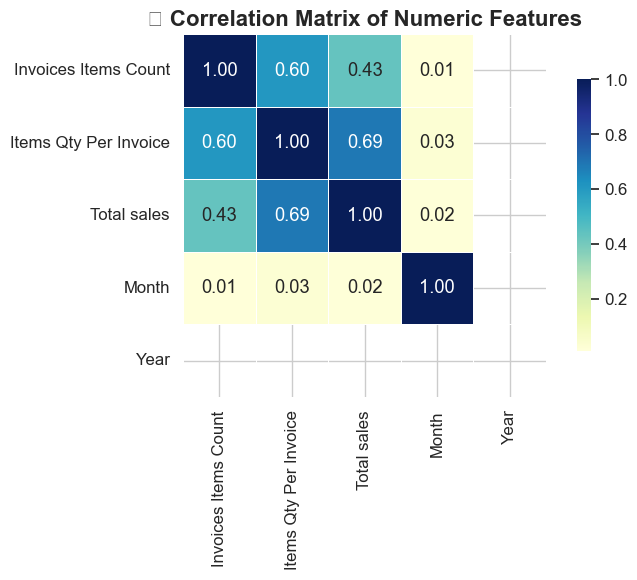

In [28]:
# Set styling
sns.set(style="whitegrid", font_scale=1.1)

# Create the correlation matrix
plt.figure(figsize=(8, 6))
corr = df.select_dtypes(include='number').corr()

# Plot heatmap
ax = sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap='YlGnBu',   # Clean & interpretable alternative to viridis
    linewidths=0.5,
    square=True,
    cbar_kws={"shrink": .75}
)

plt.title("🔗 Correlation Matrix of Numeric Features", fontsize=16, weight='bold')
plt.tight_layout()
plt.show()

#### 22. Distribution of total sales

In [29]:
fig = px.histogram(
    df,
    x='Total sales',
    nbins=50,
    title='💰 Distribution of Total Sales per Invoice',
    color_discrete_sequence=['#636EFA']
)

# Layout and formatting
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Total Sales (SAR)',
    yaxis_title='Frequency',
    plot_bgcolor='white',
    paper_bgcolor='white',
    bargap=0.1
)

fig.update_xaxes(tickprefix='SAR ')
fig.update_yaxes(showgrid=True)

fig.show()

#### 23. Pairwise relationships

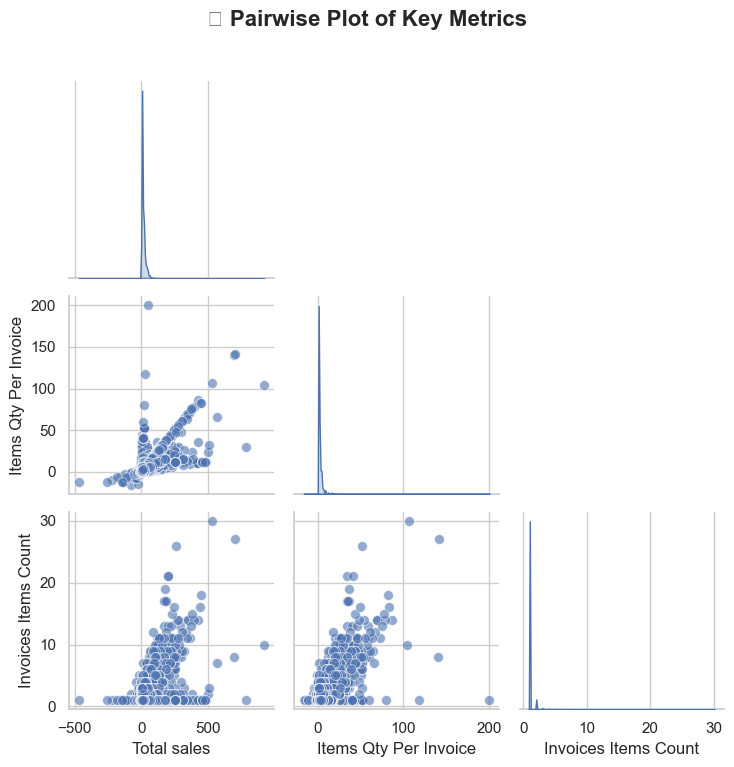

In [30]:
# Set Seaborn styling
sns.set(style='whitegrid', context='notebook')

# Create the pairplot
pair = sns.pairplot(
    df[['Total sales', 'Items Qty Per Invoice', 'Invoices Items Count']],
    corner=True,            # Removes duplicate upper triangle
    kind='scatter',
    diag_kind='kde',
    plot_kws=dict(alpha=0.6, s=50)
)

# Add a title with spacing
pair.fig.suptitle("📊 Pairwise Plot of Key Metrics", fontsize=16, weight='bold', y=1.02)

plt.tight_layout()
plt.show()


### SECTION 6 — MULTIVARIATE (BIVARIATE & TRIVARIATE) ANALYSIS

#### 24. How do gender and customer type affect total sales together?

In [31]:
# Group total sales by Gender and Customer Type
gender_type_sales = df.groupby(['Gender', 'Customer Type'])['Total sales'].sum().reset_index()

# Create grouped bar chart
fig = px.bar(
    gender_type_sales,
    x='Gender',
    y='Total sales',
    color='Customer Type',
    barmode='group',
    text='Total sales',
    title='🧾 Total Sales by Gender and Customer Type',
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Add value labels
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Layout styling
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Gender',
    yaxis_title='Total Sales (SAR)',
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Customer Type',
    legend=dict(
        orientation='h',
        y=-0.2,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    )
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()

#### 25. What is the average sales per store by customer type?

In [32]:
# Group and calculate average sales by Store ID and Customer Type
store_type_avg = df.groupby(['Store ID', 'Customer Type'])['Total sales'].mean().reset_index()

# Create grouped bar chart
fig = px.bar(
    store_type_avg,
    x='Store ID',
    y='Total sales',
    color='Customer Type',
    barmode='group',
    text='Total sales',
    title='🏪 Average Sales per Store by Customer Type',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

# Add value labels
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Layout polish
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Store ID',
    yaxis_title='Avg Sales per Invoice (SAR)',
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Customer Type',
    legend=dict(
        orientation='h',
        y=-0.25,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    )
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()

#### 26. Quantity sold by category and gender (trivariate)

In [33]:
# Group quantity by Category and Gender
cat_gender_qty = df.groupby(['Category', 'Gender'])['Items Qty Per Invoice'].sum().reset_index()

# Create grouped bar chart
fig = px.bar(
    cat_gender_qty,
    x='Category',
    y='Items Qty Per Invoice',
    color='Gender',
    barmode='group',
    text='Items Qty Per Invoice',
    title='📦 Total Quantity Sold by Category and Gender',
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Add data labels
fig.update_traces(
    texttemplate='%{text:.0f}',
    textposition='outside'
)

# Layout styling
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Product Category',
    yaxis_title='Total Quantity Sold',
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Gender',
    legend=dict(
        orientation='h',
        y=-0.25,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    )
)

fig.update_yaxes(showgrid=True)

fig.show()

#### 27. Sales by Customer City and Gender (heatmap)

In [34]:
city_gender = df.groupby(['Customer City', 'Gender'])['Total sales'].sum().reset_index()

fig = px.treemap(city_gender, path=['Customer City', 'Gender'], values='Total sales',
                 title='Treemap of Sales by City and Gender',
                 color='Total sales', color_continuous_scale='Blues')
fig.show()

#### 28. Invoice Type & Customer Type effect on average sales

In [35]:
# Group by Invoice Type and Customer Type
combo_avg_sales = df.groupby(['Invoice Type', 'Customer Type'])['Total sales'].mean().reset_index()

# Create bar chart
fig = px.bar(
    combo_avg_sales,
    x='Invoice Type',
    y='Total sales',
    color='Customer Type',
    barmode='group',
    text='Total sales',
    title='🧾 Avg Sales by Invoice Type and Customer Type',
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Add data labels
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Layout enhancements
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Invoice Type',
    yaxis_title='Average Sales per Invoice (SAR)',
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Customer Type',
    legend=dict(
        orientation='h',
        y=-0.25,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    )
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()


#### 29. Day of Week vs Customer Type vs Avg Sales

In [36]:
# Optional: ensure days are in logical order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df['Day_Name'] = pd.Categorical(df['Day_Name'], categories=day_order, ordered=True)

# Group and calculate average sales
dow_ct_sales = df.groupby(['Day_Name', 'Customer Type'])['Total sales'].mean().reset_index()

# Plot grouped bar chart
fig = px.bar(
    dow_ct_sales,
    x='Day_Name',
    y='Total sales',
    color='Customer Type',
    barmode='group',
    text='Total sales',
    title='📅 Avg Sales by Day of Week and Customer Type',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

# Add text formatting
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside'
)

# Layout and polish
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Day of Week',
    yaxis_title='Average Sales per Invoice (SAR)',
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Customer Type',
    legend=dict(
        orientation='h',
        y=-0.25,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    )
)

fig.update_yaxes(tickprefix='SAR ', showgrid=True)

fig.show()


#### 30. Bubble Chart: Quantity vs Sales by Category and Gender

In [37]:
# Aggregate sales and quantity by Category & Gender
bubble_df = df.groupby(['Category', 'Gender']).agg({
    'Total sales': 'sum',
    'Items Qty Per Invoice': 'sum'
}).reset_index()

# Bubble chart
fig = px.scatter(
    bubble_df,
    x='Items Qty Per Invoice',
    y='Total sales',
    size='Total sales',
    color='Gender',
    hover_name='Category',
    size_max=60,
    title='🔵 Bubble Chart: Quantity vs Sales by Category and Gender',
    color_discrete_sequence=px.colors.qualitative.Set1
)

# Layout and formatting
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    xaxis_title='Total Quantity Sold',
    yaxis_title='Total Sales (SAR)',
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Gender',
    legend=dict(
        orientation='h',
        y=-0.2,
        x=0.5,
        xanchor='center',
        font=dict(size=13)
    )
)

fig.update_traces(marker=dict(line=dict(width=1, color='DarkSlateGrey')))

fig.update_xaxes(showgrid=True)
fig.update_yaxes(showgrid=True, tickprefix='SAR ')

fig.show()


#### 31. Customer Type Distribution by Category and Gender

In [38]:
# Prepare data
dist3 = df.groupby(['Category', 'Gender', 'Customer Type']).size().reset_index(name='Count')

# Create sunburst chart
fig = px.sunburst(
    dist3,
    path=['Category', 'Gender', 'Customer Type'],
    values='Count',
    title='🌞 Customer Type Distribution by Category and Gender',
    color='Category',  # Color by outer ring
    color_discrete_sequence=px.colors.qualitative.Set3
)

# Update layout
fig.update_layout(
    title_font=dict(size=22, family='Arial', color='black'),
    paper_bgcolor='white',
    margin=dict(t=60, l=10, r=10, b=10)
)

fig.show()

#  Step 5: Feature Engineering + Feature Selection

### Feature Engineering

In [39]:
# Feature 1: Order Value per Item
df['OrderValuePerItem'] = df['Total sales'] / df['Items Qty Per Invoice'].replace(0, np.nan)

# Feature 2: Is Weekend
weekend_days = ['Friday', 'Saturday']
df['Trx Date'] = pd.to_datetime(df['Trx Date'])
df['Day_Name'] = df['Trx Date'].dt.day_name()
df['Is_Weekend'] = df['Day_Name'].apply(lambda x: 1 if x in weekend_days else 0)

# Feature 3: High Price Flag
avg_price = df['Total sales'].mean()
df['High_Price_Flag'] = df['Total sales'].apply(lambda x: 1 if x > avg_price else 0)

# Feature 4: Invoice Item Intensity
df['Invoice_Item_Intensity'] = df['Items Qty Per Invoice'] / df['Invoices Items Count']

# Clean potential infinite or null values
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

# Overwrite the original file with new features
df.to_excel("cleaned_final_project.xlsx", index=False)

In [40]:
df

,Store ID,Customer Type,Invoice Type,Gender,Trx Date,Category,Brand,Invoices Items Count,Items Qty Per Invoice,Total sales,Customer City,Month,Month_Name,Year,Day_Name,OrderValuePerItem,Is_Weekend,High_Price_Flag,Invoice_Item_Intensity
0,Branch0019,E-commerce,Reservation,Male,2025-01-02,BABY NUTRITION,Nuralac,1,2,20.0000,Hofuf,1,January,2025,Thursday,10.0000,0,1,2.0
1,Branch0019,E-commerce,Reservation,Male,2025-01-10,BABY NUTRITION,CERELAC,1,1,6.5175,Hofuf,1,January,2025,Friday,6.5175,1,0,1.0
2,Branch0019,E-commerce,Reservation,Male,2025-01-17,BABY NUTRITION,CERELAC,1,1,17.0750,Hofuf,1,January,2025,Friday,17.0750,1,1,1.0
3,Branch0019,E-commerce,Reservation,Male,2025-01-22,BABY NUTRITION,Nuralac,1,3,30.0000,Hofuf,1,January,2025,Wednesday,10.0000,0,1,3.0
4,Branch0019,E-commerce,Reservation,Male,2025-01-23,BABY NUTRITION,CERELAC,1,1,7.6375,Hofuf,1,January,2025,Thursday,7.6375,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206055,Branch1294,Walk-in,Walking,Female,2025-06-16,BABY NURSERY,PIGEON,1,1,7.5000,Tabuk,6,June,2025,Monday,7.5000,0,0,1.0
206056,Branch1294,Walk-in,Walking,Male,2025-06-17,BABY DIAPERS,Baby Joy,1,2,2.7550,Tabuk,6,June,2025,Tuesday,1.3775,0,0,2.0
206057,Branch1294,Walk-in,Walking,Female,2025-06-18,BABY NURSERY,PIGEON,1,1,6.2500,Tabuk,6,June,2025,Wednesday,6.2500,0,0,1.0
206058,Branch1294,Walk-in,Walking,Male,2025-06-19,BABY NURSERY,PIGEON,1,2,9.2500,Tabuk,6,June,2025,Thursday,4.6250,0,0,2.0


### FEATURE SELECTION

#### Filter Method — Correlation Threshold

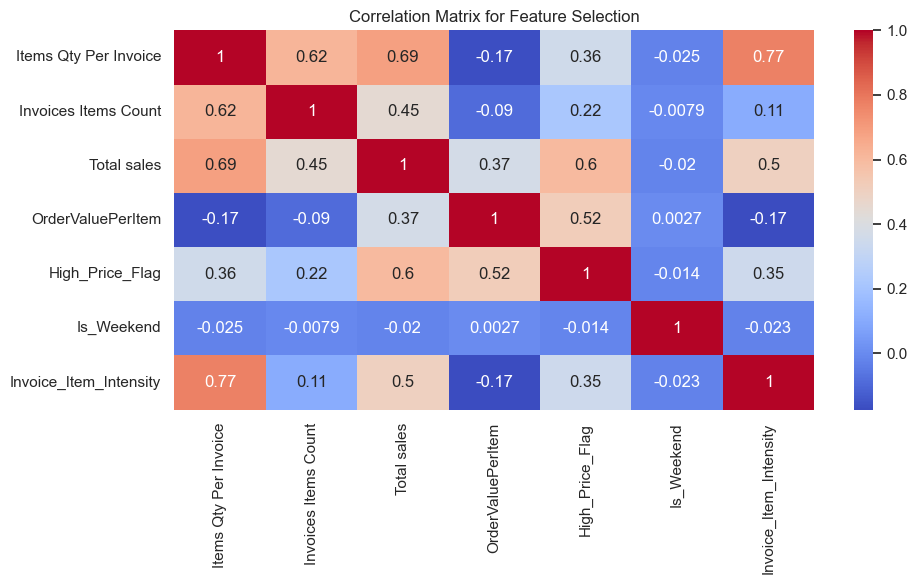

In [41]:
# Select numeric columns only
numeric_cols = ['Items Qty Per Invoice', 'Invoices Items Count', 'Total sales',
                'OrderValuePerItem', 'High_Price_Flag', 'Is_Weekend',
                'Invoice_Item_Intensity']

# Correlation Matrix
corr_matrix = df[numeric_cols].corr()
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix for Feature Selection")
plt.tight_layout()
plt.savefig("feature_correlation.png")
plt.show()

#### Embedded Method: Random Forest Importance 

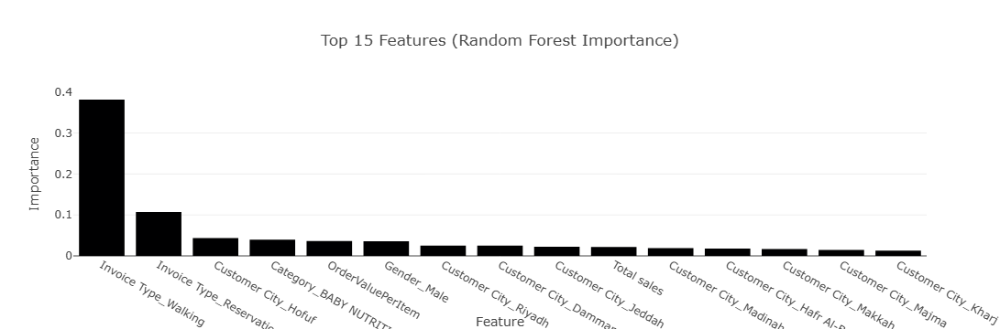

In [42]:
# Feature Selection for Classification (Customer Type)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
import plotly.express as px

# Encode the target variable
y = df['Customer Type']
y_encoded = LabelEncoder().fit_transform(y)

# Drop unused or identifier columns
X = df.drop(columns=['Customer Type', 'Trx Date', 'Store ID'])

# One-hot encode categorical features
X_encoded = pd.get_dummies(X, drop_first=True)

# ----------------------------------------
# Embedded Method: Random Forest Importance
# ----------------------------------------
model_rf = RandomForestClassifier(random_state=42)
model_rf.fit(X_encoded, y_encoded)

importances = model_rf.feature_importances_
feat_importance_df = pd.DataFrame({
    'Feature': X_encoded.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot
fig = px.bar(feat_importance_df.head(15), x='Feature', y='Importance', title='Top 15 Features (Random Forest Importance)')
fig.show()

#  Step 6: Model Training, Tuning & Evaluation

### Model Training, Tuning & Evaluation


📊 Logistic Regression Performance:
Train F1 : 0.917 | Test F1 : 0.917
Accuracy: 0.945 | Precision: 0.938 | Recall: 0.903
              precision    recall  f1-score   support

           0       0.90      0.97      0.93     16563
           1       0.92      0.74      0.82      6855
           2       1.00      1.00      1.00     17573

    accuracy                           0.94     40991
   macro avg       0.94      0.90      0.92     40991
weighted avg       0.95      0.94      0.94     40991



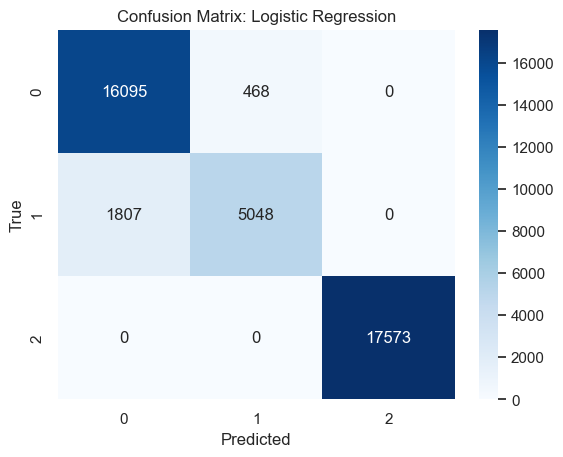


📊 Random Forest Performance:
Train F1 : 0.888 | Test F1 : 0.887
Accuracy: 0.930 | Precision: 0.943 | Recall: 0.863
              precision    recall  f1-score   support

           0       0.86      0.99      0.92     16563
           1       0.97      0.60      0.74      6855
           2       1.00      1.00      1.00     17573

    accuracy                           0.93     40991
   macro avg       0.94      0.86      0.89     40991
weighted avg       0.94      0.93      0.92     40991



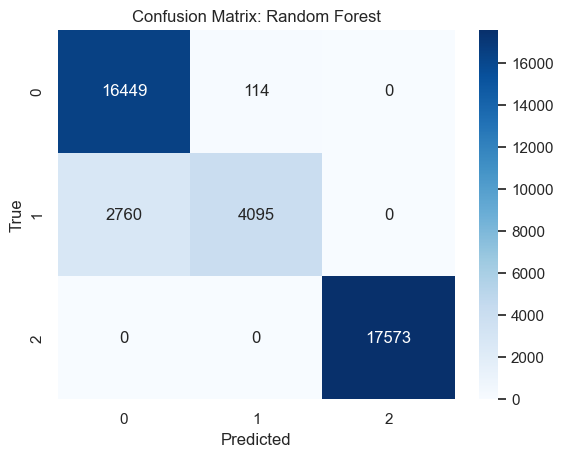


📊 K-Nearest Neighbors Performance:
Train F1 : 0.910 | Test F1 : 0.879
Accuracy: 0.915 | Precision: 0.890 | Recall: 0.871
              precision    recall  f1-score   support

           0       0.88      0.93      0.91     16563
           1       0.80      0.69      0.74      6855
           2       0.99      0.99      0.99     17573

    accuracy                           0.92     40991
   macro avg       0.89      0.87      0.88     40991
weighted avg       0.91      0.92      0.91     40991



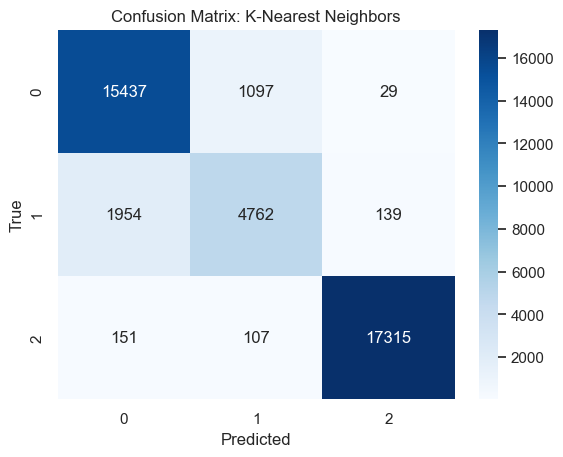


📊 Gradient Boosting Performance:
Train F1 : 0.913 | Test F1 : 0.914
Accuracy: 0.944 | Precision: 0.949 | Recall: 0.894
              precision    recall  f1-score   support

           0       0.89      0.99      0.93     16563
           1       0.96      0.69      0.81      6855
           2       1.00      1.00      1.00     17573

    accuracy                           0.94     40991
   macro avg       0.95      0.89      0.91     40991
weighted avg       0.95      0.94      0.94     40991



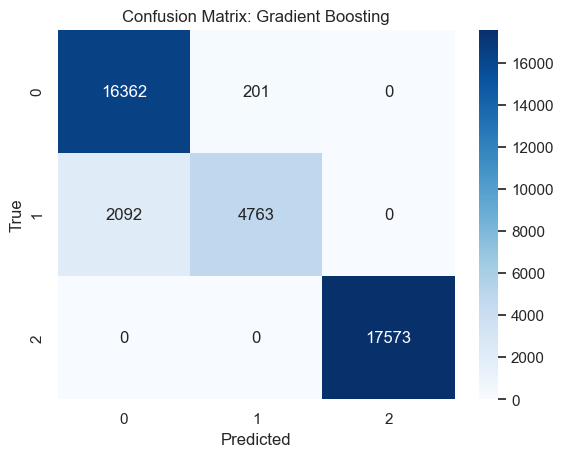


📊 GaussianNB Performance:
Train F1 : 0.900 | Test F1 : 0.898
Accuracy: 0.936 | Precision: 0.947 | Recall: 0.876
              precision    recall  f1-score   support

           0       0.87      0.99      0.93     16563
           1       0.97      0.63      0.77      6855
           2       1.00      1.00      1.00     17573

    accuracy                           0.94     40991
   macro avg       0.95      0.88      0.90     40991
weighted avg       0.94      0.94      0.93     40991



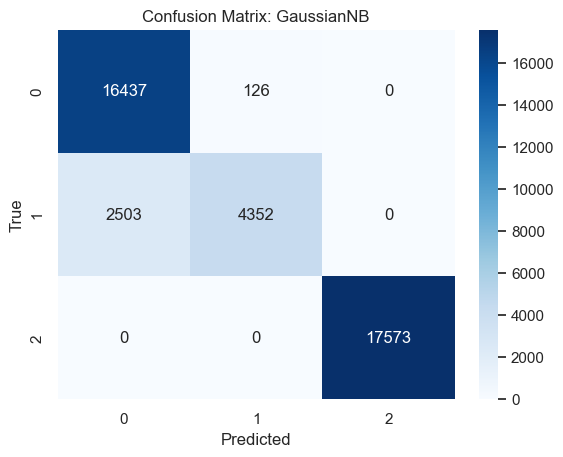


📊 Decision Tree Performance:
Train F1 : 0.956 | Test F1 : 0.919
Accuracy: 0.944 | Precision: 0.927 | Recall: 0.913
              precision    recall  f1-score   support

           0       0.92      0.95      0.93     16563
           1       0.86      0.79      0.83      6855
           2       1.00      1.00      1.00     17573

    accuracy                           0.94     40991
   macro avg       0.93      0.91      0.92     40991
weighted avg       0.94      0.94      0.94     40991



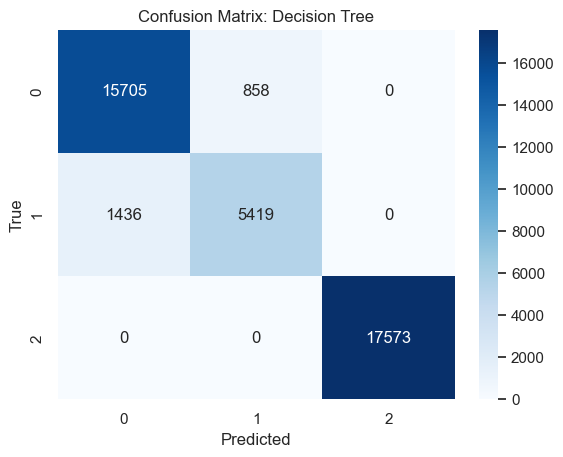


📊 AdaBoost Performance:
Train F1 : 0.760 | Test F1 : 0.754
Accuracy: 0.803 | Precision: 0.757 | Recall: 0.775
              precision    recall  f1-score   support

           0       0.83      0.65      0.73     16563
           1       0.44      0.68      0.54      6855
           2       1.00      1.00      1.00     17573

    accuracy                           0.80     40991
   macro avg       0.76      0.77      0.75     40991
weighted avg       0.84      0.80      0.81     40991



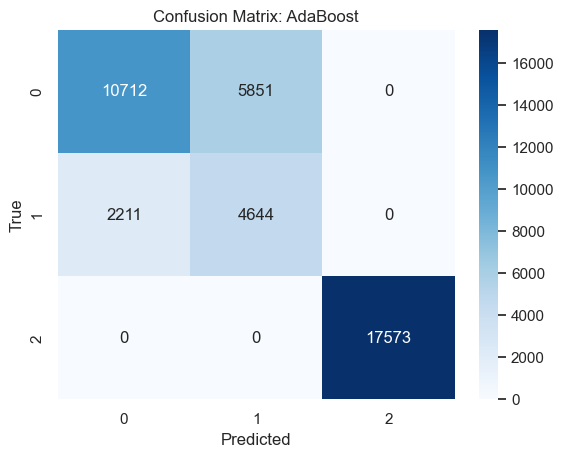


📊 XGBoost Performance:
Train F1 : 0.920 | Test F1 : 0.919
Accuracy: 0.948 | Precision: 0.953 | Recall: 0.900
              precision    recall  f1-score   support

           0       0.89      0.99      0.94     16563
           1       0.97      0.71      0.82      6855
           2       1.00      1.00      1.00     17573

    accuracy                           0.95     40991
   macro avg       0.95      0.90      0.92     40991
weighted avg       0.95      0.95      0.94     40991



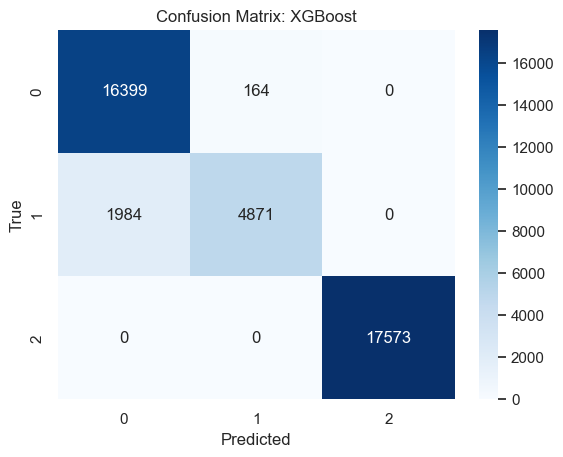

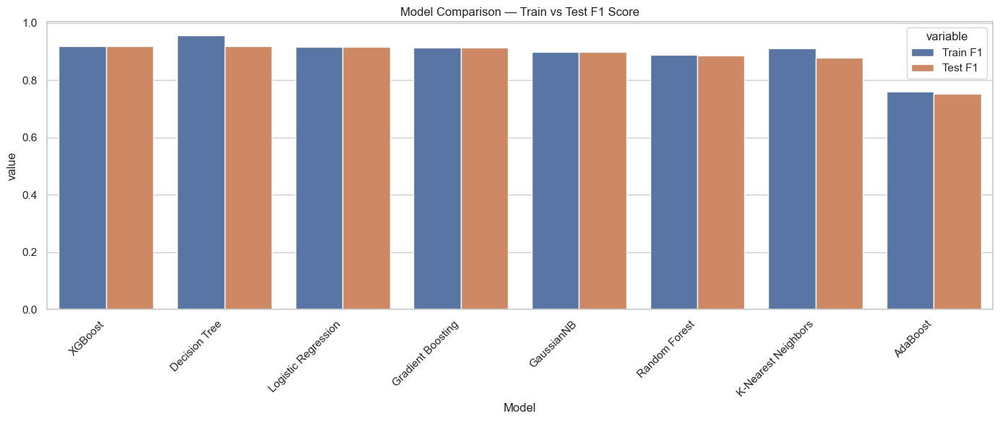


✅ Best model (XGBoost) saved to 'best_model.pkl'


In [43]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# Separate target
y = df['Customer Type']
X_raw = df.drop(columns=['Customer Type', 'Trx Date', 'Store ID', 'Day_Name'])

# Detect categorical and numerical columns
cat_cols = X_raw.select_dtypes(include='object').columns.tolist()
num_cols = X_raw.select_dtypes(exclude='object').columns.tolist()

# Label encode target
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Split
X_train, X_test, y_train, y_test = train_test_split(X_raw, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Preprocessor: OneHotEncoder + StandardScaler
preprocessor = ColumnTransformer([
    ("num", StandardScaler(), num_cols),
    ("cat", OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'), cat_cols)
])

# Models to evaluate
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Random Forest": RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42),
    "K-Nearest Neighbors": KNeighborsClassifier(n_neighbors=5),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100, learning_rate=0.1),
    "GaussianNB": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', n_estimators=100, max_depth=3)
}

scores = []

for name, model in models.items():
    pipeline = make_pipeline(preprocessor, model)
    pipeline.fit(X_train, y_train)
    y_train_pred = pipeline.predict(X_train)
    y_test_pred = pipeline.predict(X_test)

    acc = accuracy_score(y_test, y_test_pred)
    f1 = f1_score(y_test, y_test_pred, average='macro')
    precision = precision_score(y_test, y_test_pred, average='macro')
    recall = recall_score(y_test, y_test_pred, average='macro')
    f1_train = f1_score(y_train, y_train_pred, average='macro')

    scores.append({
        'Model': name,
        'Train F1': f1_train,
        'Test F1': f1,
        'Accuracy': acc,
        'Precision': precision,
        'Recall': recall
    })

    print(f"\n📊 {name} Performance:")
    print(f"Train F1 : {f1_train:.3f} | Test F1 : {f1:.3f}")
    print(f"Accuracy: {acc:.3f} | Precision: {precision:.3f} | Recall: {recall:.3f}")
    print(classification_report(y_test, y_test_pred))
    cm = confusion_matrix(y_test, y_test_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix: {name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Score summary
scores_df = pd.DataFrame(scores).sort_values(by="Test F1", ascending=False)

# Bar chart comparison
plt.figure(figsize=(14, 6))
sns.barplot(data=scores_df.melt(id_vars='Model', value_vars=['Train F1', 'Test F1']), x='Model', y='value', hue='variable')
plt.title("Model Comparison — Train vs Test F1 Score")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Save best
best_model_name = scores_df.iloc[0]['Model']
best_model = models[best_model_name]
best_pipeline = make_pipeline(preprocessor, best_model)
best_pipeline.fit(X_raw, y_encoded)
joblib.dump(best_pipeline, "best_model.pkl")
joblib.dump(le, "label_encoder.pkl")  # Save target encoder
print(f"\n✅ Best model ({best_model_name}) saved to 'best_model.pkl'")


#  Step 7: Project deployment & Dashboard

In [46]:
%%writefile Dashboard.py

import streamlit as st
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import joblib
from datetime import datetime

st.set_page_config(page_title="Pharmacy EDA Dashboard", layout="wide", page_icon="💊")

# Custom styling for Streamlit
st.markdown("""
    <style>
    .sidebar .sidebar-content {
        background-color: #D4F1F4;
    }
    .css-1d391kg, .css-1d391kg * {
        color: #004E64 !important;
    }
    </style>
""", unsafe_allow_html=True)

# Load data
@st.cache_data(show_spinner=True)
def load_data():
    df = pd.read_excel("cleaned_final_project.xlsx")
    return df

if "filtered" not in st.session_state:
    df = load_data()
    st.session_state.df = df
    st.session_state.filtered = df

# Always assign from session (safe fallback)
df = st.session_state.df
df_filtered = st.session_state.filtered

# Load best model and label encoder
model = joblib.load("best_model.pkl")
le = joblib.load("label_encoder.pkl")

# Sidebar Filters
st.sidebar.title("🔎 Filters")
with st.sidebar.expander("📍 Refine your view"):
    selected_city = st.multiselect("🏩 Select City", options=sorted(df['Customer City'].unique()), default=df['Customer City'].unique())
    selected_category = st.multiselect("🧴 Select Category", options=sorted(df['Category'].unique()), default=df['Category'].unique())
    selected_gender = st.multiselect("👤 Select Gender", options=df['Gender'].unique(), default=df['Gender'].unique())

    if st.button("✅ Apply Filters"):
        st.session_state.filtered = df[
            (df['Customer City'].isin(selected_city)) &
            (df['Category'].isin(selected_category)) &
            (df['Gender'].isin(selected_gender))
        ].copy()

        # ✅ Immediately reassign df_filtered
        df_filtered = st.session_state.filtered

# Tabs for navigation
tab1, tab2, tab3 = st.tabs(["📊 EDA Visuals", "📅 Export & Summary", "📈 ML Predictions"])

with tab1:
    st.title("📊 EDA Dashboard — E-commerce Pharmacy")
    st.markdown("Explore 15+ interactive visual questions")

    st.write("### 🔍 Filtered Data Preview")
    st.dataframe(st.session_state.filtered.head(10), use_container_width=True)

    df_filtered = st.session_state.filtered

    # Visual 1: Top Cities
    st.subheader("🏬 Top 10 Cities by Total Sales")
    top_cities = df_filtered.groupby('Customer City')['Total sales'].sum().nlargest(10).reset_index()
    st.plotly_chart(px.bar(top_cities, x='Customer City', y='Total sales', color='Customer City'), use_container_width=True)

    # Visual 2: Category Sales
    st.subheader("📦 Sales by Product Category")
    cat_sales = df_filtered.groupby('Category')['Total sales'].sum().sort_values(ascending=False).reset_index()
    st.plotly_chart(px.bar(cat_sales, x='Category', y='Total sales', color='Category'), use_container_width=True)

    # Visual 3: Gender
    st.subheader("👥 Sales by Gender")
    pie_data = df_filtered.groupby('Gender')['Total sales'].sum().reset_index()
    st.plotly_chart(px.pie(pie_data, names='Gender', values='Total sales', hole=0.4), use_container_width=True)

    # Visual 4: Monthly Trend
    st.subheader("📆 Monthly Sales Trend")
    monthly = df_filtered.groupby(['Year', 'Month_Name'])['Total sales'].sum().reset_index()
    st.plotly_chart(px.line(monthly, x='Month_Name', y='Total sales', color='Year', markers=True), use_container_width=True)

    # Visual 5: Category x Gender
    st.subheader("👥 Sales by Gender Across Categories")
    combo = df_filtered.groupby(['Gender', 'Category'])['Total sales'].sum().reset_index()
    st.plotly_chart(px.bar(combo, x='Category', y='Total sales', color='Gender', barmode='group'), use_container_width=True)

    # Visual 6: Sunburst
    st.subheader("🌍 Customer Distribution: City × Gender × Customer Type")
    dist = df_filtered.groupby(['Customer City', 'Gender', 'Customer Type']).size().reset_index(name='Count')
    st.plotly_chart(px.sunburst(dist, path=['Customer City', 'Gender', 'Customer Type'], values='Count'), use_container_width=True)

    # Visual 7: Invoice × Gender
    st.subheader("🧾 Invoice Type vs Gender")
    inv = df_filtered.groupby(['Invoice Type', 'Gender'])['Total sales'].mean().reset_index()
    st.plotly_chart(px.bar(inv, x='Invoice Type', y='Total sales', color='Gender', barmode='group'), use_container_width=True)

    # Visual 8: Bubble (QTY vs Sales)
    st.subheader("🔘 Quantity vs Sales by Category & Gender")
    bubble = df_filtered.groupby(['Category', 'Gender']).agg({'Total sales': 'sum', 'Items Qty Per Invoice': 'sum'}).reset_index()
    st.plotly_chart(px.scatter(bubble, x='Items Qty Per Invoice', y='Total sales', size='Total sales', color='Gender', hover_name='Category'), use_container_width=True)

    # Visual 9: Day of Week
    st.subheader("📅 Sales by Day of Week")
    dow = df_filtered.groupby('Day_Name')['Total sales'].sum().reset_index()
    st.plotly_chart(px.bar(dow, x='Day_Name', y='Total sales', color='Day_Name'), use_container_width=True)

    # Visual 10: Avg Qty per Category
    st.subheader("📊 Avg Qty per Invoice by Category")
    avg = df_filtered.groupby('Category')['Items Qty Per Invoice'].mean().reset_index()
    st.plotly_chart(px.bar(avg, x='Category', y='Items Qty Per Invoice', color='Category'), use_container_width=True)

    # Visual 11: Invoice × Customer Type
    st.subheader("💼 Avg Sales by Invoice & Customer Type")
    comb1 = df_filtered.groupby(['Invoice Type', 'Customer Type'])['Total sales'].mean().reset_index()
    st.plotly_chart(px.bar(comb1, x='Invoice Type', y='Total sales', color='Customer Type', barmode='group'), use_container_width=True)

    # Visual 12: Day × Customer Type
    st.subheader("📈 Avg Sales by Day & Customer Type")
    comb2 = df_filtered.groupby(['Day_Name', 'Customer Type'])['Total sales'].mean().reset_index()
    st.plotly_chart(px.bar(comb2, x='Day_Name', y='Total sales', color='Customer Type', barmode='group'), use_container_width=True)

    # Visual 13: Customer Type by Category & Gender
    st.subheader("📌 Customer Type by Category & Gender")
    sun2 = df_filtered.groupby(['Category', 'Gender', 'Customer Type']).size().reset_index(name='Count')
    st.plotly_chart(px.sunburst(sun2, path=['Category', 'Gender', 'Customer Type'], values='Count'), use_container_width=True)

    # Visual 14: Correlation Heatmap
    st.subheader("🧪 Correlation of Numeric Fields")
    numeric = df_filtered.select_dtypes(include='number')
    fig = px.imshow(numeric.corr(), text_auto=True, title='Correlation Matrix')
    st.plotly_chart(fig, use_container_width=True)

    # Visual 15: Store-wise Performance
    st.subheader("🏪 Total Sales by Store")
    stores = df_filtered.groupby('Store ID')['Total sales'].sum().reset_index()
    st.plotly_chart(px.bar(stores, x='Store ID', y='Total sales', color='Store ID'), use_container_width=True)


    # Add Month, Year, Month_Name columns for tab1 if not exist
    if 'Month' not in df_filtered.columns:
        df_filtered['Trx Date'] = pd.to_datetime(df_filtered['Trx Date'], errors='coerce')
        df_filtered['Month'] = df_filtered['Trx Date'].dt.month
        df_filtered['Month_Name'] = df_filtered['Trx Date'].dt.strftime('%B')
        df_filtered['Year'] = df_filtered['Trx Date'].dt.year

with tab2:
    st.header("📅 Export Filtered Dataset")
    st.download_button("⬇ Download CSV", df_filtered.to_csv(index=False), file_name='filtered_sales_data.csv')
    st.success("You can now download the filtered data for reporting.")

with tab3:
    st.header("📈 Predict Customer Type")

    st.markdown("Use the form below to simulate an order and predict the likely **Customer Type**.")

    with st.form("predict_form"):
        col1, col2 = st.columns(2)

        with col1:
            category = st.selectbox("Category", sorted(df['Category'].unique()))
            brand_options = df[df['Category'] == category]['Brand'].unique()
            brand = st.selectbox("Brand", sorted(brand_options))
            city = st.selectbox("Customer City", sorted(df['Customer City'].unique()))
            invoice_type = st.selectbox("Invoice Type", df['Invoice Type'].unique())
            gender = st.selectbox("Gender", df['Gender'].unique())

        with col2:
            items_count = st.number_input("Invoices Items Count", min_value=1, max_value=50, value=3, step=1)
            qty_per_invoice = st.number_input("Items Qty Per Invoice", min_value=1, max_value=200, value=5, step=1)
            total_sales = st.number_input("Total Sales", min_value=0.0, value=100.0, step=1.0)
            order_value = total_sales / qty_per_invoice
            is_weekend = st.radio("Is Weekend?", [0, 1])
            high_price_flag = int(total_sales > df['Total sales'].mean())
            invoice_intensity = qty_per_invoice / items_count
            today = datetime.today()
            month = today.month
            month_name = today.strftime('%B')
            year = today.year

        submit = st.form_submit_button("🔮 Predict")

    if submit:
        input_df = pd.DataFrame([{
            'Customer City': city,
            'Category': category,
            'Brand': brand,
            'Invoice Type': invoice_type,
            'Gender': gender,
            'Invoices Items Count': items_count,
            'Items Qty Per Invoice': qty_per_invoice,
            'Total sales': total_sales,
            'OrderValuePerItem': order_value,
            'Is_Weekend': is_weekend,
            'High_Price_Flag': high_price_flag,
            'Invoice_Item_Intensity': invoice_intensity,
            'Month': month,
            'Month_Name': month_name,
            'Year': year
        }])

        # Predict using pipeline directly (with built-in preprocessing)
        prediction = model.predict(input_df)[0]
        pred_label = le.inverse_transform([prediction])[0]

        st.success(f"🌟 Predicted Customer Type: **{pred_label}**")

# Footer
st.markdown("---")
st.markdown("Made with ❤️ for Final Project — Noureldeen Loutah")


Overwriting Dashboard.py


In [47]:
! streamlit run Dashboard.py

^C
